In [ ]:
from ultralytics import YOLO
from ultralytics.solutions import speed_estimation
import cv2

model = YOLO("yolov8n.pt")
names = model.model.names

cap = cv2.VideoCapture("C:\\Users\\yanxi\\ultralyticsEnv\\sample.mp4")
assert cap.isOpened(), "Error reading video file"
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))

# Video writer
video_writer = cv2.VideoWriter("speed_estimation.avi",
                               cv2.VideoWriter_fourcc(*'mp4v'),
                               fps,
                               (w, h))

line_pts = [(0, 2*h/3), (w, 2*h/3)]

# Init speed-estimation obj
speed_obj = speed_estimation.SpeedEstimator()
speed_obj.set_args(reg_pts=line_pts,
                   names=names,
                   view_img=True)

while cap.isOpened():

    success, im0 = cap.read()
    if not success:
        print("Video frame is empty or video processing has been successfully completed.")
        break

    tracks = model.track(im0, persist=True, show=False)

    im0 = speed_obj.estimate_speed(im0, tracks)
    video_writer.write(im0)

cap.release()
video_writer.release()
cv2.destroyAllWindows()

In [4]:
import csv
import re

input_file_path = r'C:\Users\yanxi\ultralyticsEnv\speed_data.csv'
output_file_path = r'C:\Users\yanxi\ultralyticsEnv\filtered_speed_area_data.csv'

def extract_number(tensor_string):
    """ Extracts a float from a string formatted like 'tensor(xxxx)' """
    match = re.search(r'\d+\.\d+', tensor_string)
    if match:
        return float(match.group(0))
    else:
        return None  # Return None if no number is found

def process_data(input_file, output_file):
    with open(input_file, 'r', newline='') as csvfile, open(output_file, 'w', newline='') as outfile:
        reader = csv.reader(csvfile)
        writer = csv.writer(outfile)
        writer.writerow(['Frame ID', 'Average Speed', 'Sum Area'])
        
        current_frame = None
        total_speed = 0
        speed_count = 0
        total_area = 0
        
        for row in reader:
            if reader.line_num == 1:  # Skip the header
                continue
            
            frame_id, obj_id, obj_class, speed, area = row
            # Extract numbers from strings
            speed = extract_number(speed)
            area = extract_number(area)
            
            if speed is None or area is None:
                print(f"Warning: Invalid data for Object ID {obj_id}. Speed or area could not be parsed.")
                continue
            
            if current_frame is None:
                current_frame = frame_id

            if frame_id != current_frame:
                # Calculate average speed and write data for the completed frame
                avg_speed = total_speed / speed_count if speed_count > 0 else 0
                writer.writerow([current_frame, avg_speed, total_area])
                
                # Reset for the next frame
                current_frame = frame_id
                total_speed = 0
                speed_count = 0
                total_area = 0

            # Accumulate values
            total_area += area  # Always add the area
            if speed > 0:  # Only add speed if it's greater than 0
                total_speed += speed
                speed_count += 1

        # Handle the last frame after loop
        if speed_count > 0:
            avg_speed = total_speed / speed_count
        else:
            avg_speed = 0
        writer.writerow([current_frame, avg_speed, total_area])

process_data(input_file_path, output_file_path)

print('done')

done


c:\Users\yanxi\ultralyticsEnv\.conda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


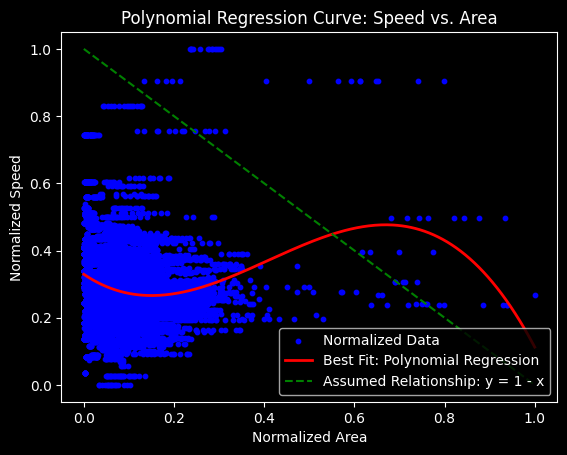

Polynomial Regression Equation: y = 0.33 + -0.91x^1 + 3.70x^2 + -3.01x^3


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

# Load data
data = pd.read_csv(r'C:\Users\yanxi\ultralyticsEnv\filtered_speed_area_data.csv')

# Normalize data
scaler = MinMaxScaler()
data[['Average Speed', 'Sum Area']] = scaler.fit_transform(data[['Average Speed', 'Sum Area']])

# Define polynomial degree
degree = 3

# Create a pipeline for polynomial regression
model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

# Fit model on entire dataset
X = data[['Sum Area']]  # Area as the independent variable
y = data['Average Speed']  # Speed as the dependent variable
model.fit(X, y)

# Generate a dense range of x-values for a smoother curve
x_range = np.linspace(X['Sum Area'].min(), X['Sum Area'].max(), 300).reshape(-1, 1)
y_pred = model.predict(x_range)

# Plot both actual data points and the polynomial regression curve
plt.scatter(X, y, color='blue', label='Normalized Data', s=10)  # Smaller dots
plt.plot(x_range, y_pred, color='red', label='Best Fit: Polynomial Regression', linewidth=2)

# Adding the dashed line y = 1 - x
plt.plot(x_range, 1 - x_range, linestyle='dashed', color='green', label='Assumed Relationship: y = 1 - x')

plt.xlabel('Normalized Area')
plt.ylabel('Normalized Speed')
plt.title('Polynomial Regression Curve: Speed vs. Area')
plt.legend(loc='lower right')
plt.show()

# Display polynomial equation
polynomial_features = model.named_steps['polynomialfeatures']
linear_regression = model.named_steps['linearregression']
coefs = linear_regression.coef_
intercept = linear_regression.intercept_
equation = f"y = {intercept:.2f}"
for i, coef in enumerate(coefs):
    if coef != 0 and i > 0:  # Skip the intercept and zero coefficients
        equation += f" + {coef:.2f}x^{i}"
print("Polynomial Regression Equation:", equation)


c:\Users\yanxi\ultralyticsEnv\.conda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


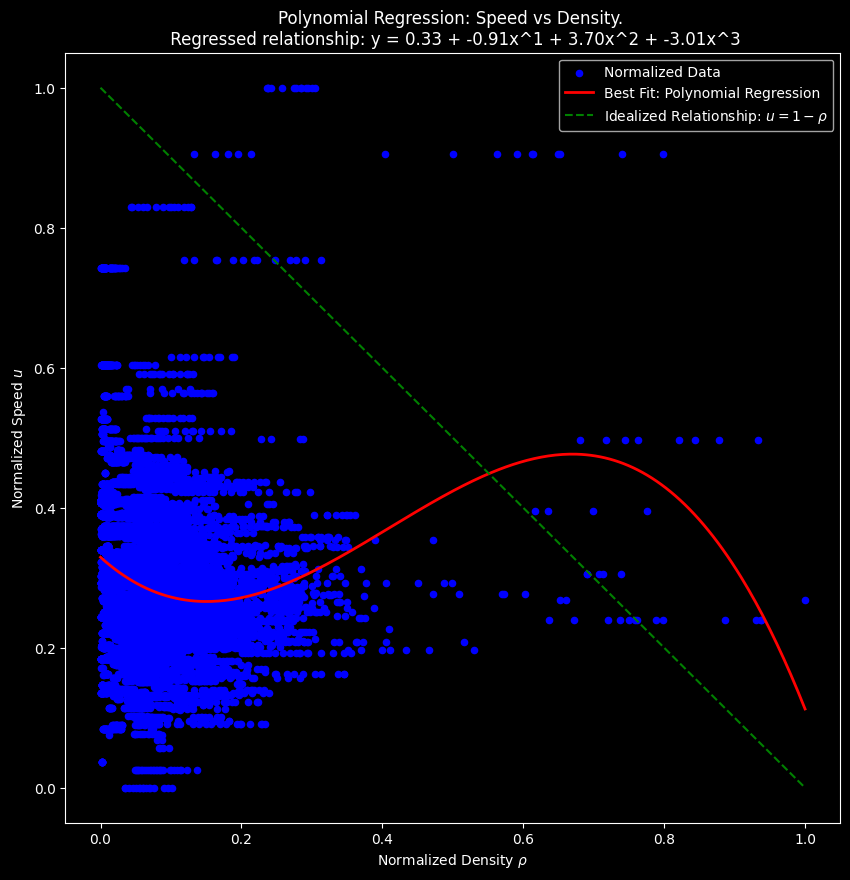

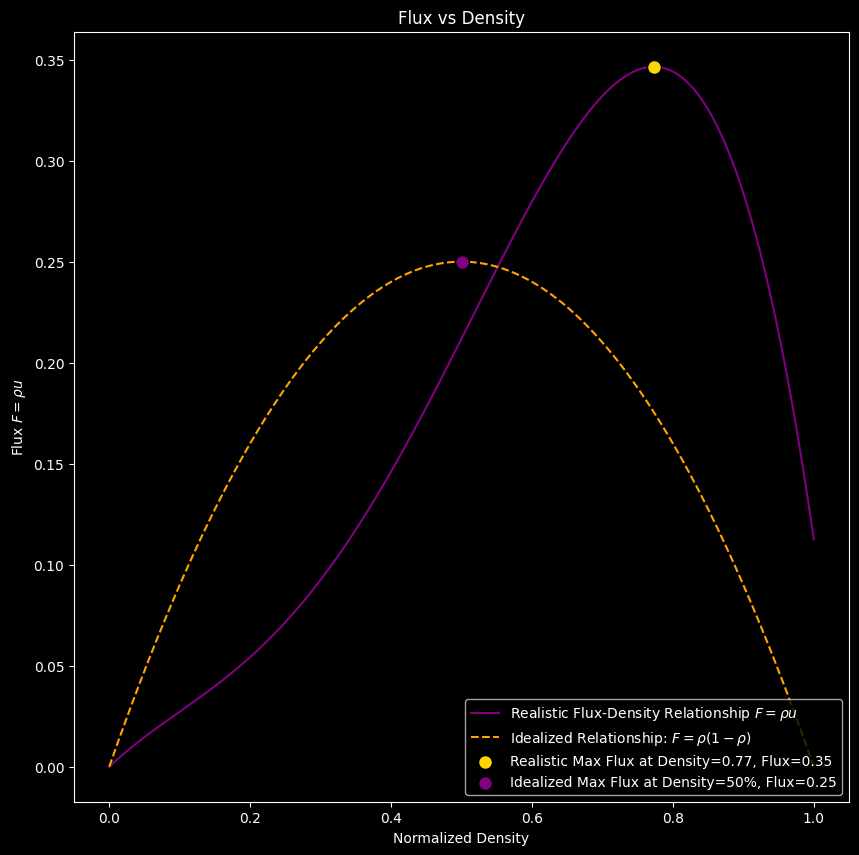

Polynomial Regression Equation: y = 0.33 + -0.91x^1 + 3.70x^2 + -3.01x^3


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

# Load data
data = pd.read_csv(r'C:\Users\yanxi\ultralyticsEnv\filtered_speed_area_data.csv')

# Normalize data
scaler = MinMaxScaler()
data[['Average Speed', 'Sum Area']] = scaler.fit_transform(data[['Average Speed', 'Sum Area']])

# Define polynomial degree
degree = 3

# Create a pipeline for polynomial regression
model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

# Fit model on entire dataset
X = data[['Sum Area']]  # Area as the independent variable
y = data['Average Speed']  # Speed as the dependent variable
model.fit(X, y)

# Generate a dense range of x-values for a smoother curve
x_range = np.linspace(X['Sum Area'].min(), X['Sum Area'].max(), 300).reshape(-1, 1)
y_pred = model.predict(x_range)

# First Plot: Polynomial Regression of Speed vs. Area
plt.figure(figsize=(10, 10))
plt.scatter(X, y, color='blue', label='Normalized Data', s=20)  # Adjust dot size for visibility
plt.plot(x_range, y_pred, color='red', label='Best Fit: Polynomial Regression', linewidth=2)
plt.plot(x_range, 1 - x_range, linestyle='dashed', color='green', label=r'Idealized Relationship: $u = 1-\rho$')
plt.xlabel(r'Normalized Density $\rho$')
plt.ylabel(r'Normalized Speed $u$')
plt.title(f'Polynomial Regression: Speed vs Density. \n Regressed relationship: {equation}')
plt.legend(loc='upper right')
plt.show()

# Second Plot: Flux (Speed * Area) vs. Area
flux = y_pred * x_range.flatten()
max_flux_index = np.argmax(flux)
max_flux = flux[max_flux_index]
max_area = x_range[max_flux_index]

plt.figure(figsize=(10, 10))
plt.plot(x_range, flux, color='purple', label=r'Realistic Flux-Density Relationship $F = \rho u$')
plt.plot(x_range, x_range - x_range**2, linestyle='dashed', color='orange', label=r'Idealized Relationship: $F = \rho(1-\rho)$')
plt.scatter(max_area, max_flux, color='gold', edgecolors='black', zorder=5, s=100,
            label=f'Realistic Max Flux at Density={max_area[0]:.2f}, Flux={max_flux:.2f}')
plt.scatter(0.5, 0.25, color='purple', edgecolors='black', zorder=5, s=100,
            label=f'Idealized Max Flux at Density=50%, Flux=0.25')
plt.xlabel('Normalized Density')
plt.ylabel(r'Flux $F = \rho u$')
plt.title('Flux vs Density')
plt.legend(loc='lower right')
plt.show()

# Display polynomial equation
polynomial_features = model.named_steps['polynomialfeatures']
linear_regression = model.named_steps['linearregression']
coefs = linear_regression.coef_
intercept = linear_regression.intercept_
equation = f"y = {intercept:.2f}"
for i, coef in enumerate(coefs):
    if coef != 0 and i > 0:  # Skip the intercept and zero coefficients
        equation += f" + {coef:.2f}x^{i}"
print("Polynomial Regression Equation:", equation)
